In [7]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import face_alignment
import plotly.graph_objs as go
import cupy
print(os.getcwd())

/home/tianyuchen/Desktop/speak_intent_model/mmWave-Intent


In [8]:
result_file = "results/1.npz"
data = np.load(result_file,allow_pickle=True) 
predictions = np.load(result_file,allow_pickle=True)["pred"]
ground_truths = np.load(result_file,allow_pickle=True)["ground_truth"]

In [9]:
def Mean_Absolute_Error(pt,gt):
    pt = np.abs(pt)
    gt = np.abs(gt)

    error = np.mean(np.sqrt(np.sum((pt-gt)**2,axis=0))/(gt))
    return error

In [10]:
def eye_NME(pt,gt):
    pt_left = pt.reshape(-1,2)[36:42]
    pt_right = pt.reshape(-1,2)[42:48]
    gt_left = gt.reshape(-1,2)[36:42]
    gt_right = gt.reshape(-1,2)[42:48]
    left_error = np.mean(np.sqrt(np.sum((pt_left - gt_left)**2,axis=1))/np.sqrt(np.sum((gt_left-gt_right)**2,axis=1)))
    right_error = np.mean(np.sqrt(np.sum((pt_right - gt_right)**2,axis=1))/np.sqrt(np.sum((gt_left-gt_right)**2,axis=1)))

    return left_error,right_error

In [11]:
def nose_err(gt,pt):
    #nose width error 
    pt = pt.reshape(-1,2)
    gt = gt.reshape(-1,2)
    pt_width= np.sum(np.power(pt[35] - pt[31],1))
    gt_width = np.sum(np.power(gt[35] - gt[31],1))
    err1 = np.abs(pt_width -gt_width)/gt_width
    
    #nose length error
    pt_len = np.abs(pt[33,1]-pt[27,1])
    gt_len = np.abs(gt[33,1]-gt[27,1])
    err2 = np.abs(pt_len -gt_len)/gt_len
    
    #nose offset error
    err3 = np.abs(pt[27,1] - gt[27,1])/gt[27,1]
    return err1,err2,err3

def eye_err(gt,pt):
    pt = pt.reshape(-1,2)
    gt = gt.reshape(-1,2)
    distance_pt = pt[39] - pt[36]
    distance_gt = gt[39] - gt[36]
    pt_angle = np.arctan2(distance_pt[1],distance_pt[0])
    gt_angle = np.arctan2(distance_gt[1],distance_gt[0])

    pt_len = np.sqrt(np.sum(distance_pt**2))
    gt_len = np.sqrt(np.sum(distance_gt**2))

    left_len_err = np.abs(pt_len-gt_len)/gt_len
    left_angle_err = np.abs(pt_angle)-np.abs(gt_angle)

    distance_pt = pt[45] - pt[42]
    distance_gt = gt[45] - gt[42]

    pt_angle = np.arctan2(distance_pt[1],distance_pt[0])
    gt_angle = np.arctan2(distance_gt[1],distance_gt[0])

    pt_len = np.sqrt(np.sum(distance_pt**2))
    gt_len = np.sqrt(np.sum(distance_gt**2))

    right_len_err = np.abs(pt_len-gt_len)/gt_len
    right_angle_err = np.abs(pt_angle)-np.abs(gt_angle)

    return left_len_err,right_len_err,left_angle_err,right_angle_err

def mouth_err(gt,pt):
    pt = pt.reshape(-1,2)
    gt = gt.reshape(-1,2)
    #prediction mouth width and two-side angle
    pt_distance = pt[48]-pt[54]
    pt_mouth_width = np.sqrt(np.sum((pt_distance)**2))

    left_side_distance_pt = pt[48] - pt[57]
    right_side_distance_pt = pt[54] - pt[57]

    left_angle_pt = np.arctan2(left_side_distance_pt[1],left_side_distance_pt[0])
    right_angle_pt = np.arctan2(right_side_distance_pt[1],right_side_distance_pt[0])

    #ground truth mouth width and two-side angle 
    gt_distance = gt[48]-gt[54]
    gt_mouth_width = np.sqrt(np.sum((gt_distance)**2))

    left_side_distance_gt = gt[48] - gt[57]
    right_side_distance_gt = gt[54] - gt[57]

    left_angle_gt = np.arctan2(left_side_distance_gt[1],left_side_distance_gt[0])
    right_angle_gt = np.arctan2(right_side_distance_gt[1],right_side_distance_gt[0])

    wid_err = (np.abs(pt_mouth_width-gt_mouth_width)/gt_mouth_width) 
    left_angle_err = np.abs(left_angle_pt)-np.abs(left_angle_gt)
    right_angle_err = np.abs(right_angle_pt)-np.abs(right_angle_gt)

    return wid_err,left_angle_err,right_angle_err

def overall_NME(pt,gt):
    pt = pt.reshape(-1,2)
    gt = gt.reshape(-1,2)
    pt_left = pt.reshape(-1,2)[36:42]
    pt_right = pt.reshape(-1,2)[42:48]
    gt_left = gt.reshape(-1,2)[36:42]
    gt_right = gt.reshape(-1,2)[42:48]
    difference  = np.mean(np.sqrt(np.sum((gt - pt)**2,axis=1)))
    reference = np.mean(np.sqrt(np.sum((gt_left-gt_right)**2,axis=1)))
    return difference/reference

def NoseNME(pt,gt):
    pt_nose = pt.reshape(-1,2)[27:36]
    gt_nose = gt.reshape(-1,2)[27:36]
    pt_left = pt.reshape(-1,2)[36:42]
    pt_right = pt.reshape(-1,2)[42:48]
    gt_left = gt.reshape(-1,2)[36:42]
    gt_right = gt.reshape(-1,2)[42:48]
    difference  = np.mean(np.sqrt(np.sum((gt_nose - pt_nose)**2,axis=1)))
    reference = np.mean(np.sqrt(np.sum((gt_left-gt_right)**2,axis=1)))

    return difference/reference

def mouthNME(pt,gt):
    pt_mouth = pt.reshape(-1,2)[48:69]
    gt_mouth = gt.reshape(-1,2)[48:69]

    pt_left = pt.reshape(-1,2)[36:42]
    pt_right = pt.reshape(-1,2)[42:48]

    gt_left = gt.reshape(-1,2)[36:42]
    gt_right = gt.reshape(-1,2)[42:48]
    difference  = np.mean(np.sqrt(np.sum((pt_mouth - gt_mouth)**2,axis=1)))
    reference = np.mean(np.sqrt(np.sum((gt_left-gt_right)**2,axis=1)))
    
    return difference/reference


In [12]:
errors = []
print(predictions.shape)
frame = 5
for i in range(1):
    subject_pt,subject_gt = predictions[i*128*frame:(i+1)*128*frame],ground_truths[i*128*frame:(i+1)*128*frame]
    
    subject_error = 0
    subject_count = 0
    subject_left_error = 0
    subject_right_error = 0

    #nose
    subject_nose_offset_error = 0
    subject_nose_width_error = 0
    subject_nose_length_error = 0
    
    #eyes
    subject_eye_left_len_error = 0
    subject_eye_right_len_error = 0 

    subject_eye_left_angle_error = 0
    subject_eye_right_angle_error = 0 
    
    #mouth
    subject_mouth_width_error = 0
    subject_mouth_left_angle_error = 0
    subject_mouth_right_angle_error = 0

    #subject NME
    face_NME = 0
    nose_NME= 0
    mouth_NME =0
    
    for idx,val in enumerate(subject_pt):
        err = Mean_Absolute_Error(subject_pt[idx]*200,subject_gt[idx])

        if err != np.inf:
            err_l,err_r = eye_NME(subject_pt[idx]*200,subject_gt[idx])
            nose_width,nose_len,nose_offset = nose_err(subject_pt[idx]*200,subject_gt[idx])
            left_eye_len,right_eye_len,left_eye_angle,right_eye_angle = eye_err(subject_pt[idx]*200,subject_gt[idx])
            mouth_wid_len, mouth_left_angle, mouth_right_angle= mouth_err(subject_pt[idx]*200,subject_gt[idx])
            oNME  = overall_NME(subject_pt[idx]*200,subject_gt[idx])
            nNME = NoseNME(subject_pt[idx]*200,subject_gt[idx])
            mNME = mouthNME(subject_pt[idx]*200,subject_gt[idx])

            nose_NME+=nNME
            mouth_NME += mNME

            #nose topological
            subject_nose_offset_error += nose_offset
            subject_nose_width_error += nose_width
            subject_nose_length_error += nose_len

            #eyes topological
            subject_eye_left_len_error += left_eye_len
            subject_eye_right_len_error += right_eye_len

            subject_eye_left_angle_error += left_eye_angle
            subject_eye_right_angle_error += right_eye_angle

            #mouth topologoical
            subject_mouth_width_error += mouth_wid_len
            subject_mouth_left_angle_error += mouth_left_angle
            subject_mouth_right_angle_error += mouth_right_angle

            #bioface
            subject_count += 1
            subject_error += err
            subject_left_error += err_l
            subject_right_error += err_r

            #overall face NME
            face_NME += oNME
    print(subject_count)
    subject_error /= subject_count
    subject_left_error /= subject_count
    subject_right_error /= subject_count

    subject_nose_offset_error /= subject_count
    subject_nose_width_error /= subject_count
    subject_nose_length_error /= subject_count

    subject_eye_left_len_error /= subject_count
    subject_eye_right_len_error /= subject_count
    subject_eye_left_angle_error /= subject_count
    subject_eye_right_angle_error /= subject_count

    subject_mouth_width_error /= subject_count
    subject_mouth_left_angle_error /= subject_count
    subject_mouth_right_angle_error /= subject_count
    face_NME /= subject_count

    mouth_NME /= subject_count
    nose_NME /= subject_count

    print("subject MAE: %f"%(subject_error),
    "\n subject_left_error: %f"%subject_left_error,
    "\n subject_right_error: %f"%subject_right_error, 
    "\n subject_nose_offset_error: %f"%subject_nose_offset_error,
    "\n subject_nose_width_error: %f"%subject_nose_width_error,
    "\n subject_nose_length_error: %f"%subject_nose_length_error,
    "\n subject_eye_left_len_error: %f"%subject_eye_left_len_error,
    "\n subject_eye_right_len_error: %f"%subject_eye_right_len_error,
    "\n subject_eye_left_angle_error: %f"%subject_eye_left_angle_error,
    "\n subject_eye_right_angle_error: %f"%subject_eye_right_angle_error,
    "\n subject_mouth_width_error: %f"%subject_mouth_width_error,
    "\n subject_mouth_left_angle_error: %f"%subject_mouth_left_angle_error,
    "\n subject_mouth_right_angle_error: %f"%subject_mouth_right_angle_error,
    "\n overall_face_NME: %f"%face_NME,
    "\n nose NME %f"% nose_NME,
    "\n mouth_NME %f"%mouth_NME

    )


(640, 1, 136)
640
subject MAE: 0.630478 
 subject_left_error: 0.069528 
 subject_right_error: 0.044879 
 subject_nose_offset_error: -0.064089 
 subject_nose_width_error: 0.069693 
 subject_nose_length_error: 0.053649 
 subject_eye_left_len_error: 0.113772 
 subject_eye_right_len_error: 0.060013 
 subject_eye_left_angle_error: 0.109464 
 subject_eye_right_angle_error: -0.033832 
 subject_mouth_width_error: 0.111756 
 subject_mouth_left_angle_error: -0.007304 
 subject_mouth_right_angle_error: -0.148098 
 overall_face_NME: 0.109748 
 nose NME 0.090507 
 mouth_NME 0.100040


(640, 1, 136)
0.18551433
False


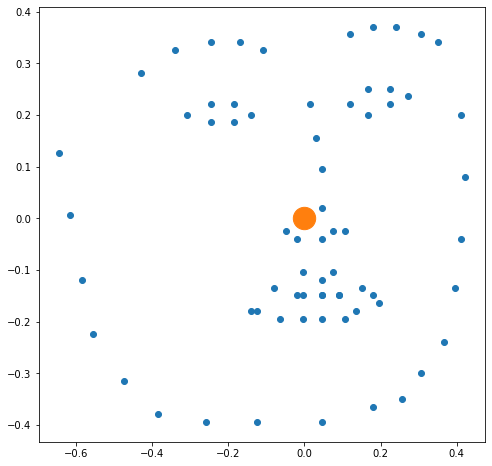

In [13]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

result_file = "results/1.npz"
data = np.load(result_file,allow_pickle=True) 
predictions = np.load(result_file,allow_pickle=True)["pred"]
ground_truths = np.load(result_file,allow_pickle=True)["ground_truth"]
print(predictions.shape)
k = 128*12
loss_test = []
plt.rcParams["figure.figsize"] = (8,8)
for k in range(0,20):
    pred_pt= (-1*predictions[k].reshape((-1,2)))
    truth_pt = (-1*ground_truths[k].reshape((-1,2)))/200
    loss_test.append(np.sum((pred_pt - truth_pt)*(pred_pt - truth_pt)))
print(np.max(np.array(loss_test)))
print((pred_pt == -1*predictions[60].reshape((-1,2)) *200).all())
centroid = np.mean(truth_pt,axis=0)
plt.scatter(truth_pt[:,0],truth_pt[:,1],label= "Ground truth landmarks")
plt.scatter(centroid[0],centroid[1],label ="centroid",s=500)
#plt.scatter(pred_pt[:,0],pred_pt[:,1],label="Predict landmarks")
#plt.legend()
plt.savefig("results_overlap",transparent=False)

#dual print
#plt.subplot(1, 2, 1)
#plt.scatter(pred_pt[:,0],pred_pt[:,1],label="landmarks")
#plt.scatter(np.mean(pred_pt[:,0]),np.mean(pred_pt[:,1]),label="centroid")
#plt.title("prediction")
#plt.legend()
#plt.subplot(1, 2, 2)
#plt.scatter(truth_pt[:,0],truth_pt[:,1],label="landmarks")
#plt.scatter(np.mean(truth_pt[:,0]),np.mean(truth_pt[:,1]),label="centroid")
#plt.title("ground truths")
#plt.legend()
#plt.savefig("results")
#plt.show()

In [14]:
losses = np.load("results/epoch_1.npy")
#for i in losses:
    #print(i)
temp = []
for epoch in range(1,16):
    losses2 = np.load("results/epoch_%d.npy"%epoch).flatten()
    temp.append(np.max(losses2))
#for loss in losses2:
#    print(loss)
print(temp)


[0.06172968, 0.10965216, 0.017840581, 0.014498239, 0.016324895, 0.31301242, 0.20837708, 0.15098555, 0.15704004, 0.21963641, 0.20921612, 0.1525482, 0.270487, 0.21761599, 0.18476269]


In [15]:
print("nose_error: " + str(nose_err(truth_pt,pred_pt)))
print("eye_error: "+str(eye_err(truth_pt,pred_pt)))
print("mouth_error: "+str(mouth_err(truth_pt,pred_pt)))

nose_error: (-0.24570823, 0.07183758, 0.060076315)
eye_error: (0.14789778, 0.06407201, 0.09898591, -0.06516218)
mouth_error: (0.12409566, 0.031481862, -0.10892248)


In [1]:
import numpy as np
import plotly.graph_objects as go
import pandas as pd
data = np.load("realtime/-15--10.dbf/-15--10.dbf.coordinate.npy",mmap_mode ='r+')
print(data.shape)
fake_data= np.repeat(data[:,np.newaxis,:,:],128,axis=1)
print(fake_data[0][0] == fake_data[0][127])
points = data[1]
unq, count = np.unique(points, axis=0, return_counts=True)
print(unq[count>1])
print(points)
k = 0
df = pd.DataFrame(data[4],columns = ['x','y','z','c'])
fig = go.Figure(data=[go.Scatter3d(x=data[k][:,0], y=data[k][:,1], z=data[k][:,2],mode='markers',
    marker=dict(
        size=12,
        color=data[k][:,3],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
        ))])
fig.update_layout(autosize=False,
    width=1500,
    height=1500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ))
fig.show()

(5, 40000, 4)
[[ True  True  True  True]
 [ True  True  True  True]
 [ True  True  True  True]
 ...
 [ True  True  True  True]
 [ True  True  True  True]
 [ True  True  True  True]]
[]
[[-0.87875743 16.76769072  2.65938591 13.50655628]
 [-0.58598704 16.78047335  2.65938591 13.43470035]
 [-1.17126015 16.74980048  2.65938591 13.28703367]
 ...
 [ 8.54318736 13.1553549  16.82113514 10.55278298]
 [-0.24562003 14.071562   27.62120225  9.98157911]
 [-2.10202729 14.95670132 18.65150307 10.21491668]]
